In [ ]:
from servlm.client import SerVLMClient
from servlm.image import draw_boxes, draw_polys
from PIL import Image

import json

def pprint(text):
    print(json.dumps(text, indent=2))


client = SerVLMClient('http://127.0.0.1:8000')

# Detection

{
  "id": "7dbe4a8a-1479-449d-9a26-43a344bf91ea",
  "model": "microsoft/Florence-2-base",
  "results": {
    "detection": {
      "boxes": [
        {
          "xyxy": [
            515.6000366210938,
            29.102998733520508,
            654.7999877929688,
            182.36099243164062
          ],
          "label": "bread"
        },
        {
          "xyxy": [
            518.0,
            78.23099517822266,
            620.4000244140625,
            248.57699584960938
          ],
          "label": "bread"
        },
        {
          "xyxy": [
            42.0,
            22.69499969482422,
            798.7999877929688,
            533.198974609375
          ],
          "label": "chopping board"
        },
        {
          "xyxy": [
            641.2000122070312,
            37.112998962402344,
            766.0,
            306.7829895019531
          ],
          "label": "garlic"
        },
        {
          "xyxy": [
            502.8000183105469,
      

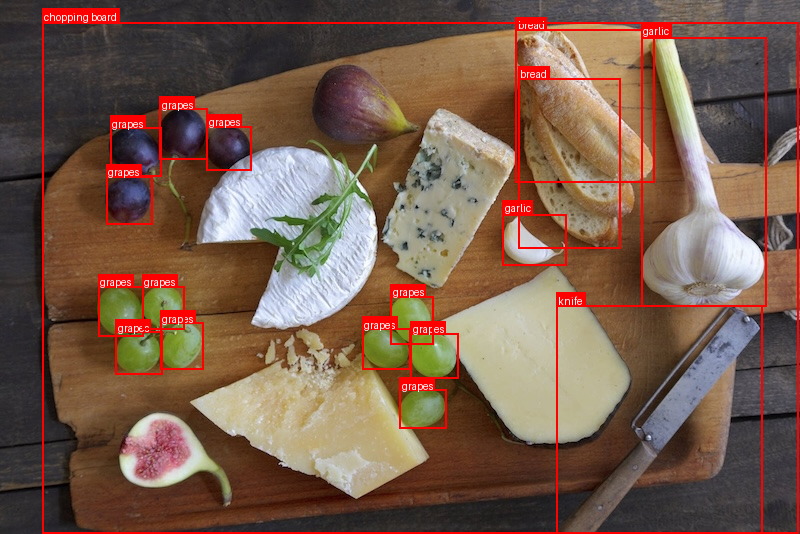

In [2]:
image = Image.open('./data/table.jpg')

response = client.detect(image)

pprint(response)
draw_boxes(image.copy(), response['results']['detection']['boxes'])

## Prompted Detection

{
  "id": "933052cc-1e44-458d-b3f0-10c99517b7ac",
  "model": "microsoft/Florence-2-base",
  "results": {
    "detection": {
      "boxes": [
        {
          "xyxy": [
            117.20000457763672,
            410.9129943847656,
            235.60000610351562,
            508.6349792480469
          ],
          "label": "fig"
        },
        {
          "xyxy": [
            310.8000183105469,
            62.21099853515625,
            421.20001220703125,
            146.0489959716797
          ],
          "label": "fig"
        }
      ]
    }
  },
  "image": {
    "width": 800,
    "height": 534
  }
}


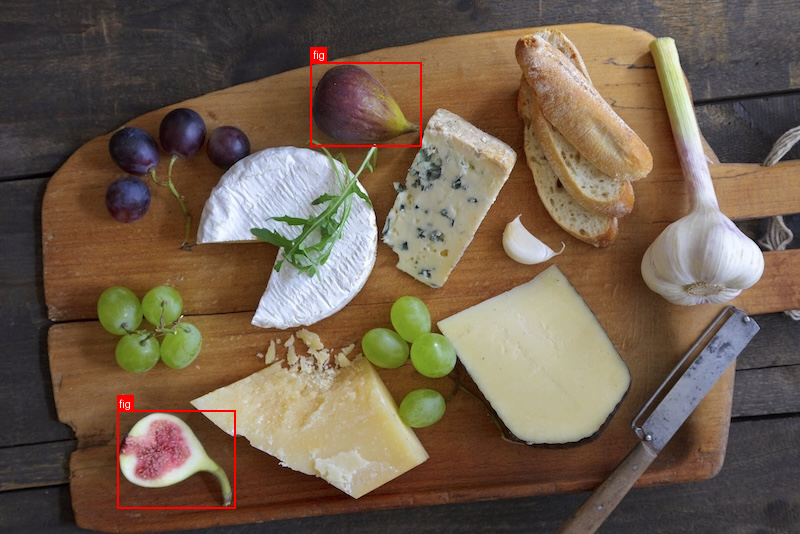

In [3]:
image = Image.open('./data/table.jpg')

response = client.detect(image, prompt='fig')

pprint(response)
draw_boxes(image.copy(), response['results']['detection']['boxes'])

# Image Captioning

In [4]:
image = Image.open('./data/table.jpg')

response = client.caption(image)
pprint(response)

for x in ['short', 'medium', 'long', 'dense']:
    print(x)
    response = client.caption(image, format=x)
    pprint(response)

{
  "id": "d30696e4-3f08-4e24-9f21-8bc4b8d432d8",
  "model": "microsoft/Florence-2-base",
  "results": {
    "caption": {
      "text": "A wooden cutting board topped with different types of cheese.",
      "boxes": null
    }
  },
  "image": {
    "width": 800,
    "height": 534
  }
}
short
{
  "id": "7b5f311f-f777-491f-965f-f115b0a81407",
  "model": "microsoft/Florence-2-base",
  "results": {
    "caption": {
      "text": "A wooden cutting board topped with different types of cheese.",
      "boxes": null
    }
  },
  "image": {
    "width": 800,
    "height": 534
  }
}
medium
{
  "id": "44b8ad3e-3895-40c7-b4aa-f1453eb9c864",
  "model": "microsoft/Florence-2-base",
  "results": {
    "caption": {
      "text": "The image shows a wooden cutting board with a variety of cheeses, grapes, figs, garlic, and bread arranged on it. There is also a knife placed on the board, suggesting that the food is ready to be enjoyed.",
      "boxes": null
    }
  },
  "image": {
    "width": 800,
    "h

# OCR

{
  "id": "93fb77fe-3b5c-4f25-b304-e5080ed9f7c6",
  "model": "microsoft/Florence-2-base",
  "results": {
    "ocr": {
      "text": null,
      "polys": [
        {
          "points": [
            432.77752685546875,
            241.07850646972656,
            876.3925170898438,
            241.07850646972656,
            876.3925170898438,
            292.7925109863281,
            432.77752685546875,
            294.3135070800781
          ],
          "label": "</s>Nutrition Facts"
        },
        {
          "points": [
            432.77752685546875,
            297.3554992675781,
            770.9075317382812,
            297.3554992675781,
            770.9075317382812,
            333.8594970703125,
            432.77752685546875,
            333.8594970703125
          ],
          "label": "Serving Size 1 oz (28 g)"
        },
        {
          "points": [
            432.77752685546875,
            336.9015197753906,
            854.717529296875,
            335.38049

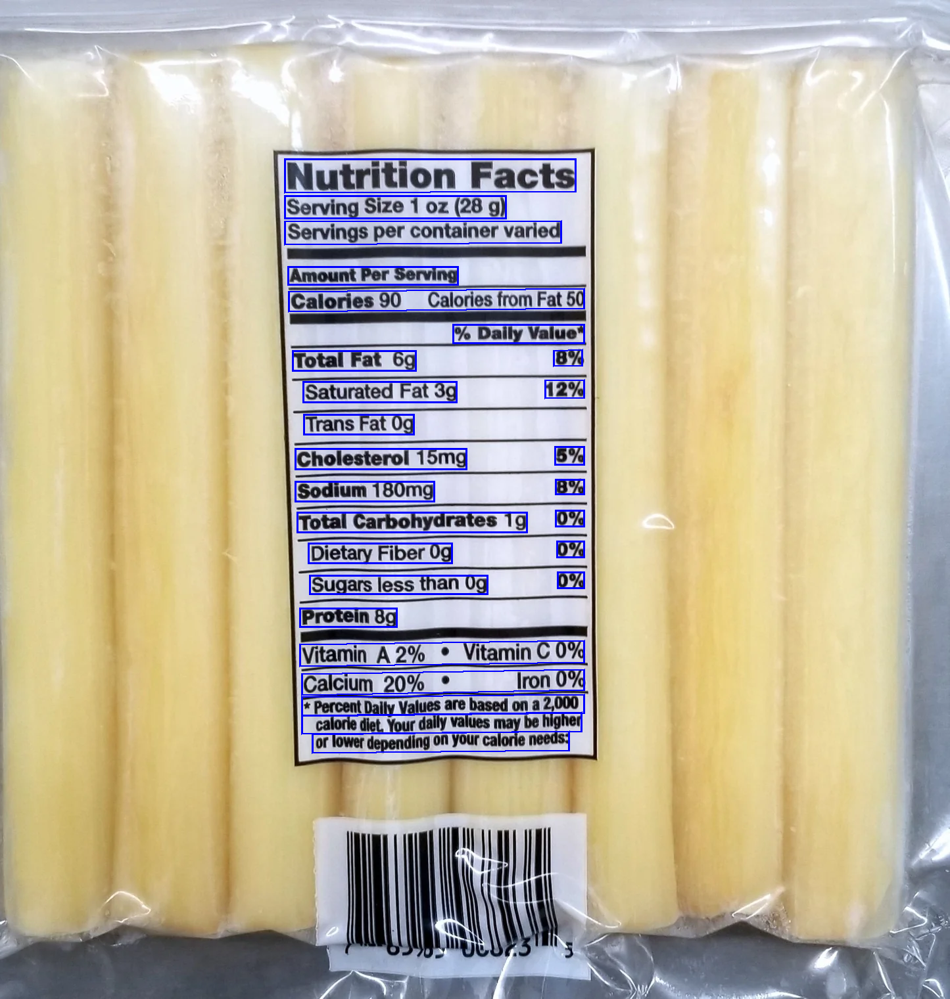

In [6]:
image = Image.open('./data/label.webp')

response = client.ocr(image, polys=True)

pprint(response)
draw_polys(image, response['results']['ocr']['polys'])
image

{
  "id": "b1fce674-baac-4187-ba10-0978f0292a8c",
  "model": "microsoft/Florence-2-base",
  "results": {
    "ocr": {
      "text": "Nutrition FactsServing Size 1 oz (28 g)Servings per container variedAmount Per ServingCalories 90 Calories from Fat 50% Daily Value*Total Fat 6g8%Saturated Fat 3g12%Trans Fat 0gCholesterol 15mg5%Sodium 180mg8%Total Carbohydrates 1g0%Dietary Fiber 0g0%.Sugars less than 0g%Protein 8gVitamin A 2% . Vitamin C 0%Calcium 20%Iron 0%* Percent Daily Values are based on a 2,000* Percent daily values may be higheror lower depending on your calorie needs.",
      "polys": null
    }
  },
  "image": {
    "height": 1521,
    "width": 1445
  }
}


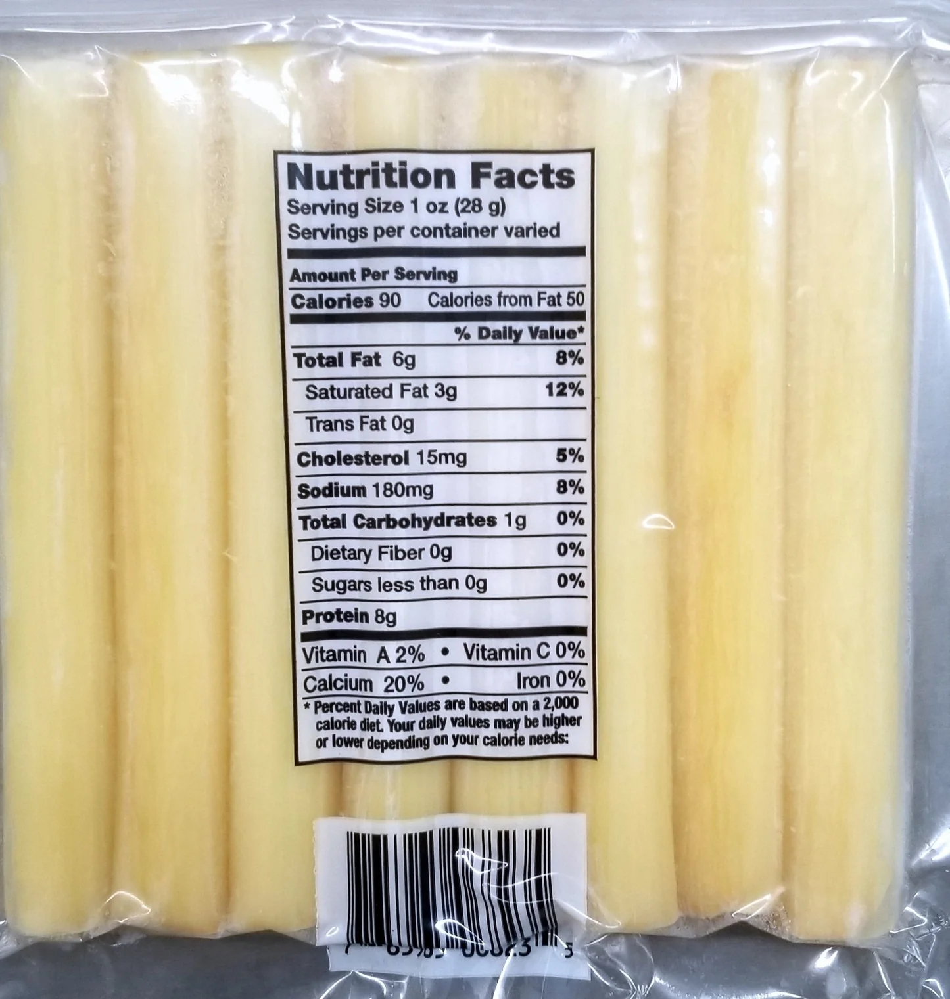

In [22]:
image = Image.open('./data/label.webp')

response = client.ocr(image)

pprint(response)
image